# Linear Regression

Linear regression is one of the most popular regression algorithms and produces good predictions for well-prepared data. Its optimization function computes coefficients to express a response column as a linear relationship of its predictors. 

You must verify the Gauss-Markov assumptions when using linear regression algorithms:

<ul class="ul_content">
 <li><b>Linearity</b> : the parameters we are estimating using the OLS method must be linear.</li>
 <li><b>Non-Collinearity</b> : the regressors being calculated aren’t perfectly correlated with each other.</li>
 <li><b>Exogeneity</b> : the regressors aren’t correlated with the error term.</li>
 <li><b>Homoscedasticity</b> : no matter what the values of our regressors might be, the error of the variance is constant.</li>
</ul>

To create a good linear regression model, it's important to:

<ul class="ul_content">
 <li>Impute missing values</li>
 <li>Encode categorical features (linear regression only accepts numerical variables)</li>
 <li>Compute the correlation matrix to retrieve highly-correlated predictors</li>
 <li>Decompose the data (optional)</li>
 <li>Normalize the data (optional, but recommended)</li>
</ul>

## Example without decomposition

Let's use the <a href="../../../data/africa_education.csv">'africa_education'</a> dataset to compute a linear regression model of students' performance in school.

,123student_scoreFloat(22),123teacher_scoreFloat(22),123teacher_year_teachingNumeric(9),123number_students_schoolInteger,Abcenglish_at_homeVarchar(32),Abctravel_distanceVarchar(22),Abcmeans_of_travelVarchar(26),AbcVarchar(68),AbcVarchar(68),Abcsource_of_lightingVarchar(24),123days_absentInteger,Abcrepeated_gradesVarchar(20),Abcsitting_placeVarchar(54),123ageInteger,123socio_eco_statutNumeric(9),AbccountryVarchar(24)
1,681.138508424325,[null],26.0,24,ALL THE TIME,>0.5-1KM,CAR,,,ELECTRIC,0,NEVER,I have my own sitting place,12,15.0,South Africa
2,425.993367323877,581.994282503848,10.0,23,SOMETIMES,>4.5-5KM,WALK,,,PARAFFIN/OIL,0,NEVER,I have my own sitting place,14,5.0,Namibia
3,534.329515370892,581.994282503848,10.0,23,SOMETIMES,>0.5-1KM,WALK,,,ELECTRIC,0,NEVER,I have my own sitting place,13,7.0,Namibia
4,536.690743411639,581.994282503848,10.0,23,SOMETIMES,UP TO 0.5KM,WALK,,,ELECTRIC,0,NEVER,I have my own sitting place,12,8.0,Namibia
5,569.392927563969,581.994282503848,10.0,23,SOMETIMES,UP TO 0.5KM,WALK,,,ELECTRIC,0,NEVER,I have my own sitting place,13,9.0,Namibia
6,542.037992351316,581.994282503848,10.0,23,MOST OF THE TIME,UP TO 0.5KM,WALK,,,ELECTRIC,0,NEVER,I have my own sitting place,12,11.0,Namibia
7,573.771789981159,581.994282503848,10.0,23,MOST OF THE TIME,>1.5-2KM,CAR,,,ELECTRIC,0,NEVER,I have my own sitting place,12,11.0,Namibia
8,589.279157441376,581.994282503848,10.0,23,SOMETIMES,UP TO 0.5KM,WALK,,,ELECTRIC,0,NEVER,I have my own sitting place,12,12.0,Namibia
9,496.740841813343,581.994282503848,10.0,23,SOMETIMES,>2.5-3KM,CAR,,,ELECTRIC,0,NEVER,I have my own sitting place,14,12.0,Namibia
10,535.805274812767,601.83282358059,1.0,22,ALL THE TIME,>1-1.5KM,WALK,,,ELECTRIC,0,NEVER,I have my own sitting place,13,10.0,Mozambique

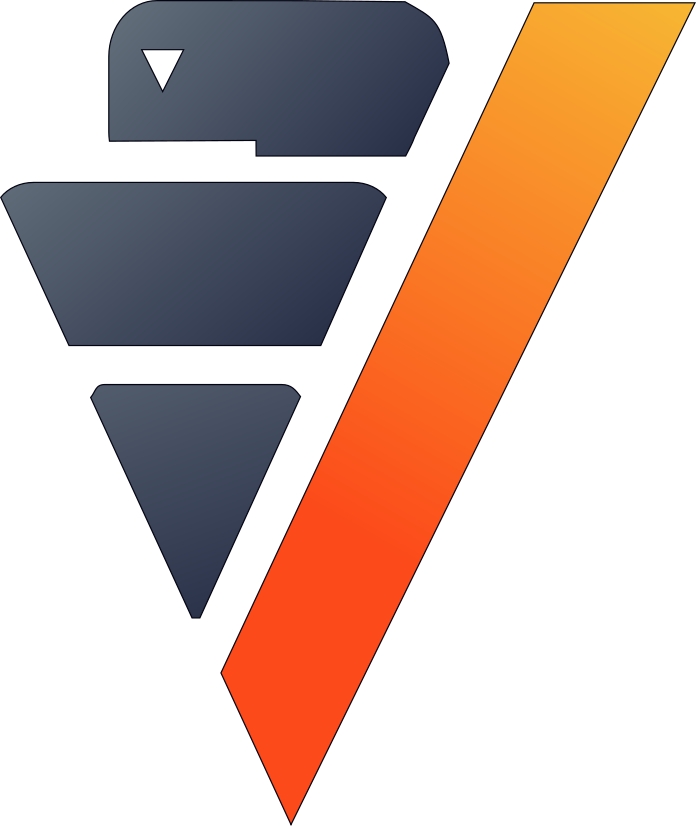

In [1]:
import verticapy as vp
vp.set_option("plotting_lib","highcharts")
africa = vp.read_csv("data/africa_education.csv")
africa = africa.select(["(zralocp + zmalocp) / 2 AS student_score",
                        "zraloct AS teacher_score",
                        "XNUMYRS AS teacher_year_teaching",
                        "numstu AS number_students_school",
                        "PENGLISH AS english_at_home",
                        "PTRAVEL AS travel_distance",
                        "PTRAVEL2 AS means_of_travel",
                        "PMOTHER AS m_education",
                        "PFATHER AS f_education",
                        "PLIGHT AS source_of_lighting",
                        "PABSENT AS days_absent",
                        "PREPEAT AS repeated_grades",
                        "zpsit AS sitting_place",
                        "PAGE AS age",
                        "zpses AS socio_eco_statut",
                        "country_long AS country"])
display(africa)

First, let's look for missing values.

,count,percent
"""number_students_school""",59909.0,100.0
"""english_at_home""",59909.0,100.0
"""travel_distance""",59909.0,100.0
"""means_of_travel""",59909.0,100.0
"""m_education""",59909.0,100.0
"""source_of_lighting""",59909.0,100.0
"""days_absent""",59909.0,100.0
"""repeated_grades""",59909.0,100.0
"""sitting_place""",59909.0,100.0
"""age""",59909.0,100.0

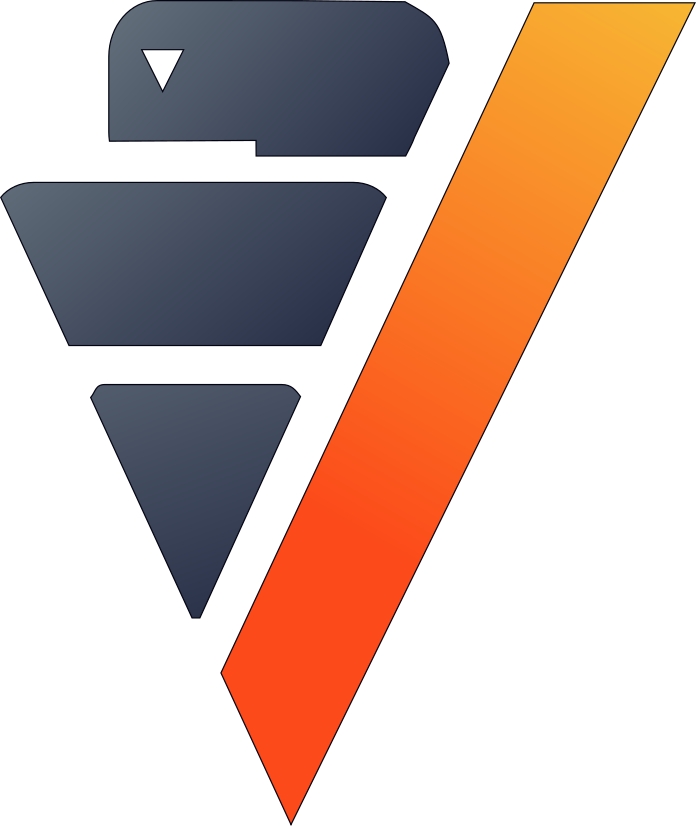

In [2]:
africa.count_percent()

We'll simply drop the missing values to avoid adding bias to the data.

6722 elements were filtered.


,123student_scoreFloat(22),123teacher_scoreFloat(22),123teacher_year_teachingNumeric(9),123number_students_schoolInteger,Abcenglish_at_homeVarchar(32),Abctravel_distanceVarchar(22),Abcmeans_of_travelVarchar(26),AbcVarchar(68),AbcVarchar(68),Abcsource_of_lightingVarchar(24),123days_absentInteger,Abcrepeated_gradesVarchar(20),Abcsitting_placeVarchar(54),123ageInteger,123socio_eco_statutNumeric(9),AbccountryVarchar(24)
1,425.993367323877,581.994282503848,10.0,23,SOMETIMES,>4.5-5KM,WALK,,,PARAFFIN/OIL,0,NEVER,I have my own sitting place,14,5.0,Namibia
2,534.329515370892,581.994282503848,10.0,23,SOMETIMES,>0.5-1KM,WALK,,,ELECTRIC,0,NEVER,I have my own sitting place,13,7.0,Namibia
3,536.690743411639,581.994282503848,10.0,23,SOMETIMES,UP TO 0.5KM,WALK,,,ELECTRIC,0,NEVER,I have my own sitting place,12,8.0,Namibia
4,569.392927563969,581.994282503848,10.0,23,SOMETIMES,UP TO 0.5KM,WALK,,,ELECTRIC,0,NEVER,I have my own sitting place,13,9.0,Namibia
5,542.037992351316,581.994282503848,10.0,23,MOST OF THE TIME,UP TO 0.5KM,WALK,,,ELECTRIC,0,NEVER,I have my own sitting place,12,11.0,Namibia
6,573.771789981159,581.994282503848,10.0,23,MOST OF THE TIME,>1.5-2KM,CAR,,,ELECTRIC,0,NEVER,I have my own sitting place,12,11.0,Namibia
7,589.279157441376,581.994282503848,10.0,23,SOMETIMES,UP TO 0.5KM,WALK,,,ELECTRIC,0,NEVER,I have my own sitting place,12,12.0,Namibia
8,496.740841813343,581.994282503848,10.0,23,SOMETIMES,>2.5-3KM,CAR,,,ELECTRIC,0,NEVER,I have my own sitting place,14,12.0,Namibia
9,535.805274812767,601.83282358059,1.0,22,ALL THE TIME,>1-1.5KM,WALK,,,ELECTRIC,0,NEVER,I have my own sitting place,13,10.0,Mozambique
10,420.509155247374,715.046036359878,1.0,25,ALL THE TIME,>5KM,WALK,,,PARAFFIN/OIL,0,NEVER,I have my own sitting place,13,3.0,Zanzibar

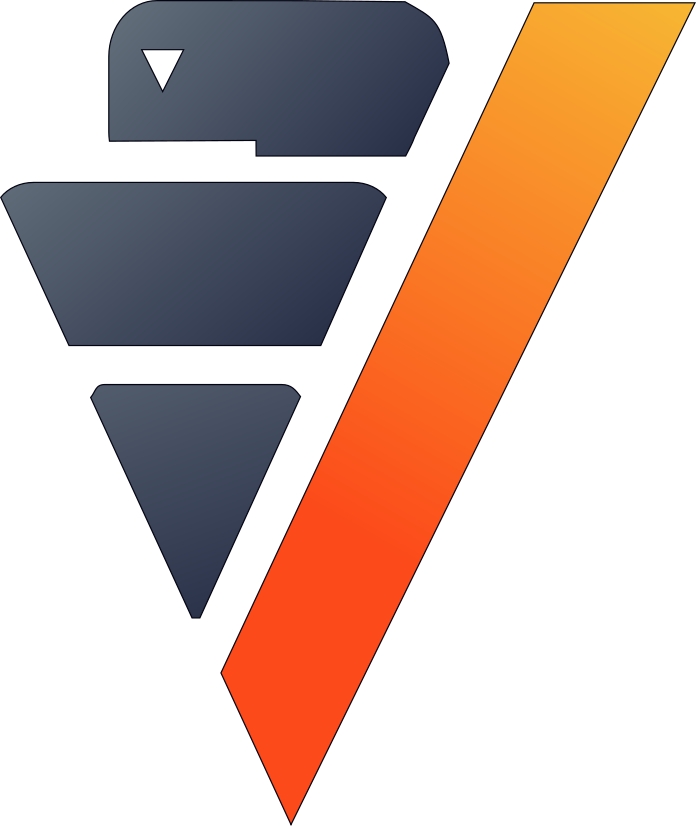

In [3]:
africa.dropna()

We need to encode the categorical columns to dummies to retain linearity.

/opt/venv/lib/python3.10/site-packages/verticapy/core/vdataframe/_encoding.py:123: Warning: The vDataColumn '"student_score"' was ignored because of its high cardinality.
Increase the parameter 'max_cardinality' to solve this issue or use directly the vDataColumn get_dummies method.
  warnings.warn(warning_message, Warning)
/opt/venv/lib/python3.10/site-packages/verticapy/core/vdataframe/_encoding.py:123: Warning: The vDataColumn '"teacher_score"' was ignored because of its high cardinality.
Increase the parameter 'max_cardinality' to solve this issue or use directly the vDataColumn get_dummies method.
  warnings.warn(warning_message, Warning)
/opt/venv/lib/python3.10/site-packages/verticapy/core/vdataframe/_encoding.py:123: Warning: The vDataColumn '"teacher_year_teaching"' was ignored because of its high cardinality.
Increase the parameter 'max_cardinality' to solve this issue or use directly the vDataColumn get_dummies method.
  warnings.warn(warning_message, Warning)
/opt/venv/lib/

,123student_scoreFloat(22),123teacher_scoreFloat(22),123teacher_year_teachingNumeric(9),123number_students_schoolInteger,Abcenglish_at_homeVarchar(32),Abctravel_distanceVarchar(22),Abcmeans_of_travelVarchar(26),AbcVarchar(68),AbcVarchar(68),Abcsource_of_lightingVarchar(24),123days_absentInteger,Abcrepeated_gradesVarchar(20),Abcsitting_placeVarchar(54),123ageInteger,123socio_eco_statutNumeric(9),AbccountryVarchar(24),123english_at_home_ALL_THE_TIMEInteger,123english_at_home_MOST_OF_THE_TIMEInteger,123english_at_home_NEVERInteger,123travel_distance_>0.5-1KMInteger,123travel_distance_>1-1.5KMInteger,123travel_distance_>1.5-2KMInteger,123travel_distance_>2-2.5KMInteger,123travel_distance_>2.5-3KMInteger,123travel_distance_>3-3.5KMInteger,...,123socio_eco_statut_3.000Integer,123socio_eco_statut_4.000Integer,123socio_eco_statut_5.000Integer,123socio_eco_statut_6.000Integer,123socio_eco_statut_7.000Integer,123socio_eco_statut_8.000Integer,123socio_eco_statut_9.000Integer,123socio_eco_statut_10.000Integer,123socio_eco_statut_11.000Integer,123socio_eco_statut_12.000Integer,123socio_eco_statut_13.000Integer,123socio_eco_statut_14.000Integer,123country_BotswanaInteger,123country_KenyaInteger,123country_LesothoInteger,123country_MalawiInteger,123country_MozambiqueInteger,123country_NamibiaInteger,123country_SeychellesInteger,123country_South_AfricaInteger,123country_SwazilandInteger,123country_TanzaniaInteger,123country_UgandaInteger,123country_ZambiaInteger,123country_ZanzibarInteger
1,425.993367323877,581.994282503848,10.0,23,SOMETIMES,>4.5-5KM,WALK,,,PARAFFIN/OIL,0,NEVER,I have my own sitting place,14,5.0,Namibia,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
2,534.329515370892,581.994282503848,10.0,23,SOMETIMES,>0.5-1KM,WALK,,,ELECTRIC,0,NEVER,I have my own sitting place,13,7.0,Namibia,0,0,0,1,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
3,536.690743411639,581.994282503848,10.0,23,SOMETIMES,UP TO 0.5KM,WALK,,,ELECTRIC,0,NEVER,I have my own sitting place,12,8.0,Namibia,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
4,569.392927563969,581.994282503848,10.0,23,SOMETIMES,UP TO 0.5KM,WALK,,,ELECTRIC,0,NEVER,I have my own sitting place,13,9.0,Namibia,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
5,542.037992351316,581.994282503848,10.0,23,MOST OF THE TIME,UP TO 0.5KM,WALK,,,ELECTRIC,0,NEVER,I have my own sitting place,12,11.0,Namibia,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
6,573.771789981159,581.994282503848,10.0,23,MOST OF THE TIME,>1.5-2KM,CAR,,,ELECTRIC,0,NEVER,I have my own sitting place,12,11.0,Namibia,0,1,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
7,589.279157441376,581.994282503848,10.0,23,SOMETIMES,UP TO 0.5KM,WALK,,,ELECTRIC,0,NEVER,I have my own sitting place,12,12.0,Namibia,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
8,496.740841813343,581.994282503848,10.0,23,SOMETIMES,>2.5-3KM,CAR,,,ELECTRIC,0,NEVER,I have my own sitting place,14,12.0,Namibia,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
9,535.805274812767,601.83282358059,1.0,22,ALL THE TIME,>1-1.5KM,WALK,,,ELECTRIC,0,NEVER,I have my own sitting place,13,10.0,Mozambique,1,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
10,420.509155247374,715.046036359878,1.0,25,ALL THE TIME,>5KM,WALK,,,PARAFFIN/OIL,0,NEVER,I have my own sitting place,13,3.0,Zanzibar,1,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1

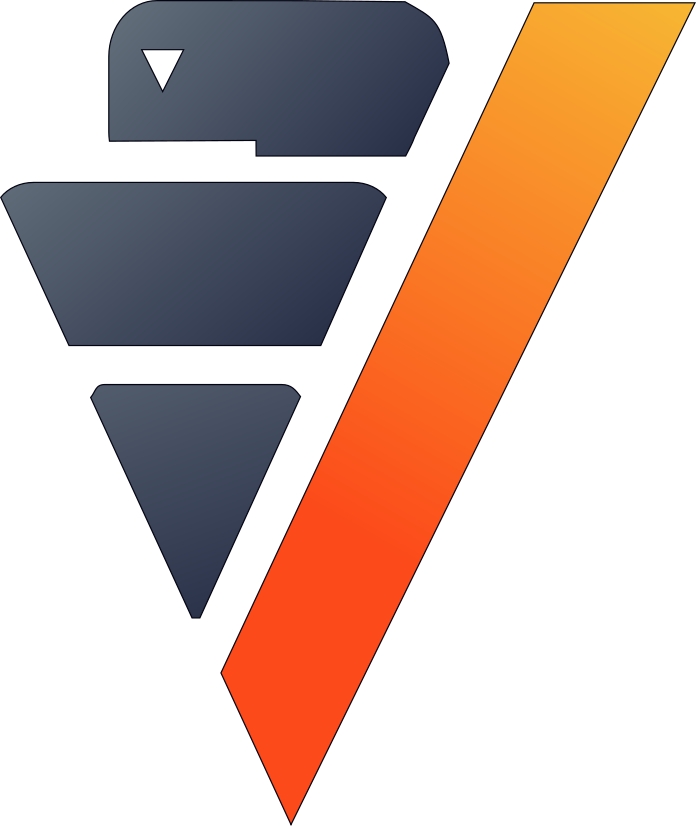

In [4]:
africa.one_hot_encode(max_cardinality = 20)

Linear regression can only handle numerical columns, so we'll drop the categorical columns.

,123student_scoreFloat(22),123teacher_scoreFloat(22),123teacher_year_teachingNumeric(9),123number_students_schoolInteger,123days_absentInteger,123ageInteger,123socio_eco_statutNumeric(9),123english_at_home_ALL_THE_TIMEInteger,123english_at_home_MOST_OF_THE_TIMEInteger,123english_at_home_NEVERInteger,123travel_distance_>0.5-1KMInteger,123travel_distance_>1-1.5KMInteger,123travel_distance_>1.5-2KMInteger,123travel_distance_>2-2.5KMInteger,123travel_distance_>2.5-3KMInteger,123travel_distance_>3-3.5KMInteger,123travel_distance_>3.5-4KMInteger,123travel_distance_>4.5-5KMInteger,123travel_distance_>4KM-4.5KMInteger,123travel_distance_>5KMInteger,123means_of_travel_BICYCLEInteger,123means_of_travel_BUS_TRUCK_VANInteger,123means_of_travel_CARInteger,123means_of_travel_OTHERInteger,123means_of_travel_TRAINInteger,...,123socio_eco_statut_3.000Integer,123socio_eco_statut_4.000Integer,123socio_eco_statut_5.000Integer,123socio_eco_statut_6.000Integer,123socio_eco_statut_7.000Integer,123socio_eco_statut_8.000Integer,123socio_eco_statut_9.000Integer,123socio_eco_statut_10.000Integer,123socio_eco_statut_11.000Integer,123socio_eco_statut_12.000Integer,123socio_eco_statut_13.000Integer,123socio_eco_statut_14.000Integer,123country_BotswanaInteger,123country_KenyaInteger,123country_LesothoInteger,123country_MalawiInteger,123country_MozambiqueInteger,123country_NamibiaInteger,123country_SeychellesInteger,123country_South_AfricaInteger,123country_SwazilandInteger,123country_TanzaniaInteger,123country_UgandaInteger,123country_ZambiaInteger,123country_ZanzibarInteger
1,425.993367323877,581.994282503848,10.0,23,0,14,5.0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
2,534.329515370892,581.994282503848,10.0,23,0,13,7.0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
3,536.690743411639,581.994282503848,10.0,23,0,12,8.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
4,569.392927563969,581.994282503848,10.0,23,0,13,9.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
5,542.037992351316,581.994282503848,10.0,23,0,12,11.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
6,573.771789981159,581.994282503848,10.0,23,0,12,11.0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
7,589.279157441376,581.994282503848,10.0,23,0,12,12.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
8,496.740841813343,581.994282503848,10.0,23,0,14,12.0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
9,535.805274812767,601.83282358059,1.0,22,0,13,10.0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
10,420.509155247374,715.046036359878,1.0,25,0,13,3.0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1

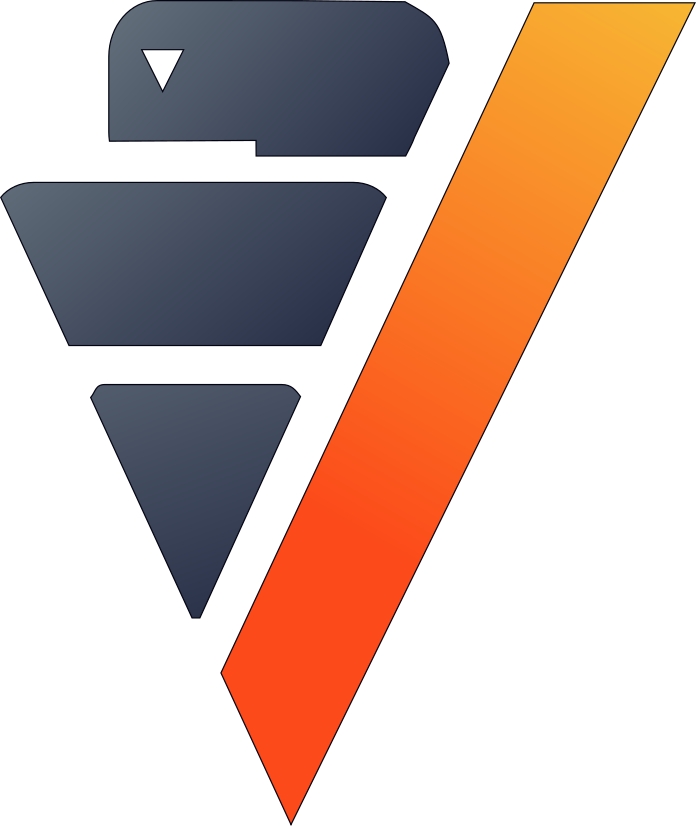

In [5]:
africa.drop(columns = ["english_at_home",
                       "travel_distance",
                       "means_of_travel",
                       "m_education",
                       "f_education",
                       "source_of_lighting",
                       "repeated_grades",
                       "sitting_place",
                       "country"])

Let's look at the correlation between the response column and the predictors. We'll look to keep columns with correlations coefficients greater than 20% (the top 10 features).

In [6]:
x = africa.corr(focus = "student_score", show = False)

,123student_scoreFloat(22),123socio_eco_statutNumeric(9),123source_of_lighting_ELECTRICInteger,123means_of_travel_CARInteger,123socio_eco_statut_14.000Integer,123repeated_grades_NEVERInteger,123english_at_home_NEVERInteger,123ageInteger,123country_TanzaniaInteger,123teacher_scoreFloat(22),123source_of_lighting_CANDLEInteger,123Integer
1,425.993367323877,5.0,0,0,0,1,0,14,0,581.994282503848,0,
2,534.329515370892,7.0,1,0,0,1,0,13,0,581.994282503848,0,
3,536.690743411639,8.0,1,0,0,1,0,12,0,581.994282503848,0,
4,569.392927563969,9.0,1,0,0,1,0,13,0,581.994282503848,0,
5,542.037992351316,11.0,1,0,0,1,0,12,0,581.994282503848,0,
6,573.771789981159,11.0,1,1,0,1,0,12,0,581.994282503848,0,
7,589.279157441376,12.0,1,0,0,1,0,12,0,581.994282503848,0,
8,496.740841813343,12.0,1,1,0,1,0,14,0,581.994282503848,0,
9,535.805274812767,10.0,1,0,0,1,0,13,0,601.83282358059,0,
10,420.509155247374,3.0,0,0,0,1,0,13,0,715.046036359878,0,

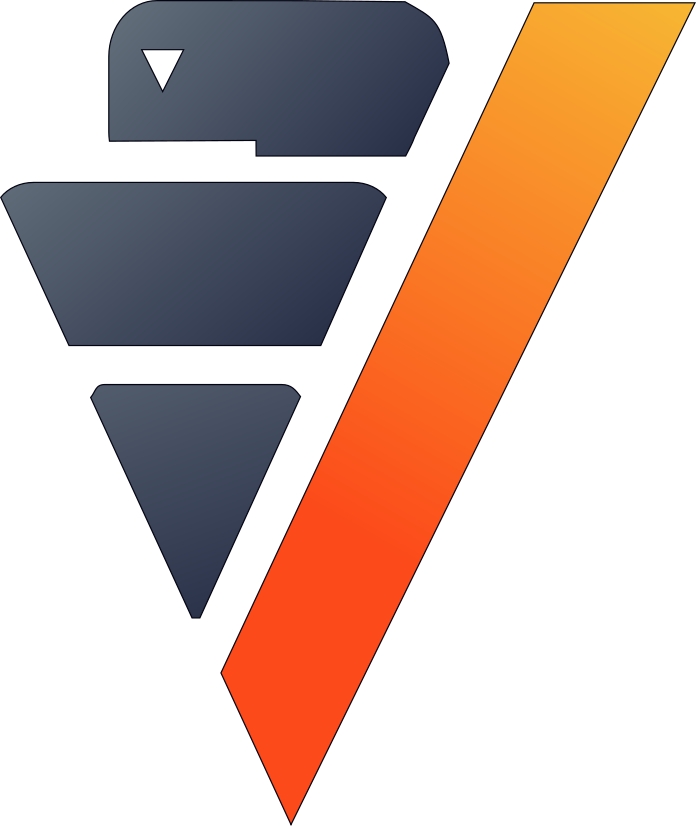

In [7]:
africa = africa.select(columns = x["index"][0:12])
display(africa)

Let's examine the correlation matrix to see if we have any independent predictors.

In [8]:
africa.corr()

Some of these features are highly-correlated, like socioeconomic status and having an electric lighting. We'll drop the lighting column to avoid unexpected results while computing the linear regression.

,123student_scoreFloat(22),123socio_eco_statutNumeric(9),123means_of_travel_CARInteger,123socio_eco_statut_14.000Integer,123repeated_grades_NEVERInteger,123english_at_home_NEVERInteger,123ageInteger,123country_TanzaniaInteger,123teacher_scoreFloat(22),123source_of_lighting_CANDLEInteger,123Integer
1,425.993367323877,5.0,0,0,1,0,14,0,581.994282503848,0,
2,534.329515370892,7.0,0,0,1,0,13,0,581.994282503848,0,
3,536.690743411639,8.0,0,0,1,0,12,0,581.994282503848,0,
4,569.392927563969,9.0,0,0,1,0,13,0,581.994282503848,0,
5,542.037992351316,11.0,0,0,1,0,12,0,581.994282503848,0,
6,573.771789981159,11.0,1,0,1,0,12,0,581.994282503848,0,
7,589.279157441376,12.0,0,0,1,0,12,0,581.994282503848,0,
8,496.740841813343,12.0,1,0,1,0,14,0,581.994282503848,0,
9,535.805274812767,10.0,0,0,1,0,13,0,601.83282358059,0,
10,420.509155247374,3.0,0,0,1,0,13,0,715.046036359878,0,

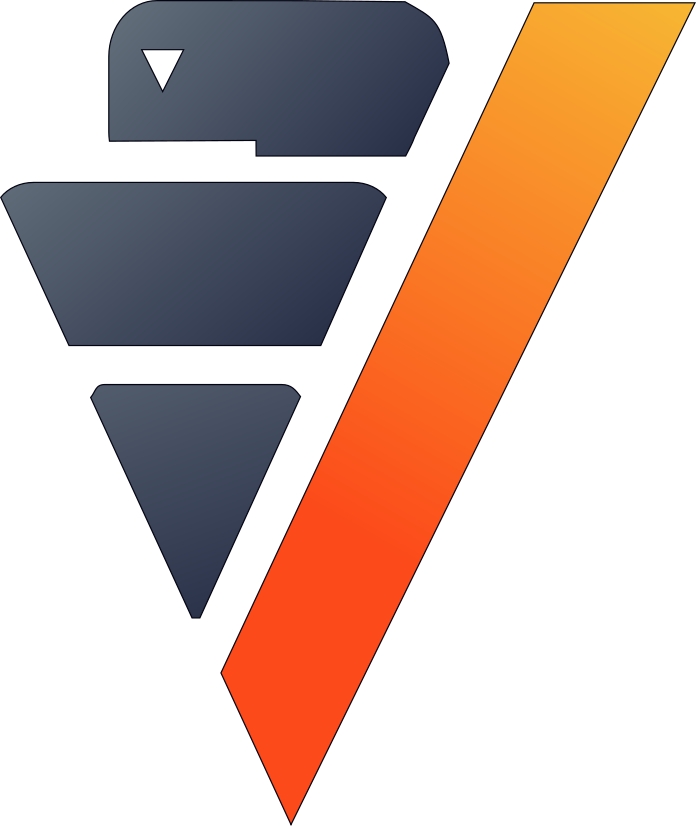

In [9]:
africa["source_of_lighting_ELECTRIC"].drop()

Let's normalize the dataset to follow the Gaussian-Markov assumptions.

,123student_scoreFloat(22),123socio_eco_statutNumeric(49),123means_of_travel_CARNumeric(66),123socio_eco_statut_14.000Numeric(66),123repeated_grades_NEVERNumeric(65),123english_at_home_NEVERNumeric(65),123ageNumeric(62),123country_TanzaniaNumeric(65),123teacher_scoreFloat(22),123source_of_lighting_CANDLENumeric(65),123Numeric(65)
1,425.993367323877,-0.6232054442632663,-0.23922040624412672,-0.17707300662955064,0.8056324835156974,-0.48379887843849295,0.38534838713324965,-0.28509087397763944,-2.25571926837901,-0.5195382107595631,
2,534.329515370892,-0.03943601904258274,-0.23922040624412672,-0.17707300662955064,0.8056324835156974,-0.48379887843849295,-0.21271185991828412,-0.28509087397763944,-2.25571926837901,-0.5195382107595631,
3,536.690743411639,0.25244869356775906,-0.23922040624412672,-0.17707300662955064,0.8056324835156974,-0.48379887843849295,-0.8107721069698178,-0.28509087397763944,-2.25571926837901,-0.5195382107595631,
4,569.392927563969,0.5443334061781009,-0.23922040624412672,-0.17707300662955064,0.8056324835156974,-0.48379887843849295,-0.21271185991828412,-0.28509087397763944,-2.25571926837901,-0.5195382107595631,
5,542.037992351316,1.1281028313987844,-0.23922040624412672,-0.17707300662955064,0.8056324835156974,-0.48379887843849295,-0.8107721069698178,-0.28509087397763944,-2.25571926837901,-0.5195382107595631,
6,573.771789981159,1.1281028313987844,4.180166793098136,-0.17707300662955064,0.8056324835156974,-0.48379887843849295,-0.8107721069698178,-0.28509087397763944,-2.25571926837901,-0.5195382107595631,
7,589.279157441376,1.4199875440091263,-0.23922040624412672,-0.17707300662955064,0.8056324835156974,-0.48379887843849295,-0.8107721069698178,-0.28509087397763944,-2.25571926837901,-0.5195382107595631,
8,496.740841813343,1.4199875440091263,4.180166793098136,-0.17707300662955064,0.8056324835156974,-0.48379887843849295,0.38534838713324965,-0.28509087397763944,-2.25571926837901,-0.5195382107595631,
9,535.805274812767,0.8362181187884427,-0.23922040624412672,-0.17707300662955064,0.8056324835156974,-0.48379887843849295,-0.21271185991828412,-0.28509087397763944,-1.98588881675302,-0.5195382107595631,
10,420.509155247374,-1.20697486948395,-0.23922040624412672,-0.17707300662955064,0.8056324835156974,-0.48379887843849295,-0.21271185991828412,-0.28509087397763944,-0.446039075983578,-0.5195382107595631,

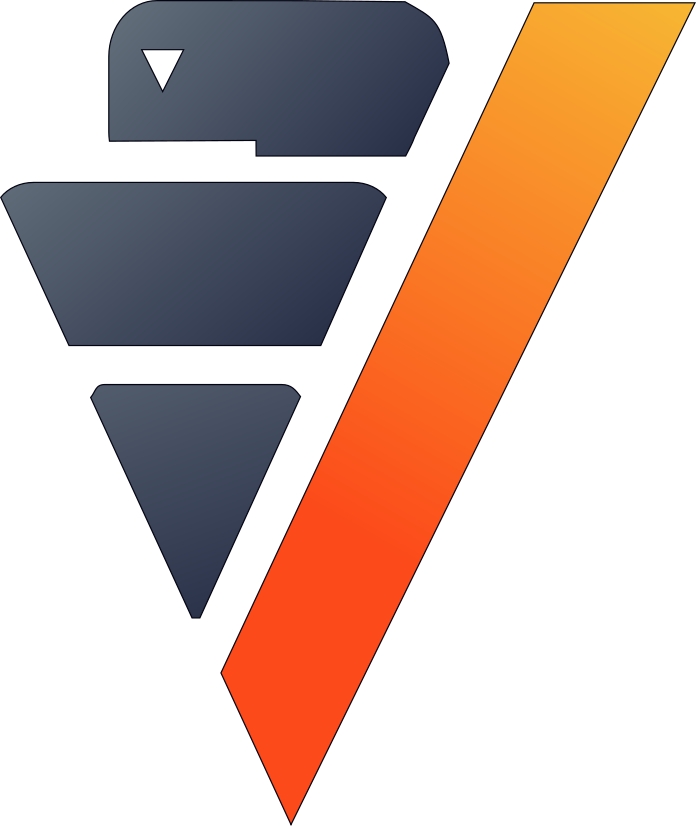

In [10]:
africa.normalize(columns = africa.get_columns(exclude_columns = ["student_score"]))

We can use a cross-validation to test our model.

  0%|          | 0/3 [00:00<?, ?it/s]

,explained_variance,max_error,median_absolute_error,mean_absolute_error,mean_squared_error,root_mean_squared_error,r2,r2_adj,aic,bic,time
1-fold,0.298760420922965,454.869941453916,48.2210772255159,57.1543070024498,5338.63008987636,72.4282147941313,0.298760190415264,0.298365325946778,152537.040399237,152622.64984117,1.1311068534851074
2-fold,0.290976792434127,389.687661828984,48.6556666765512,57.7359307029193,5318.83475392814,73.0176869855228,0.290968638054247,0.290569857760689,152651.186957684,152736.809425035,1.0947003364562988
3-fold,0.29592130733471,455.880251469504,48.9063941477698,58.1178896758865,5331.51254823777,73.8833042681213,0.295920687999041,0.2955219569355,151646.613109167,151732.159688654,1.123023271560669
avg,0.29521950689726734,433.479284917468,48.59437934994563,57.66937579375186,5329.659130680757,73.10973534925846,0.29521650548951733,0.294819046880989,152278.28015536268,152363.872984953,1.1162768205006917
std,0.0032161686319344554,30.968100481245564,0.2831159047501379,0.3961860329757309,8.186989630147114,0.5975929608459388,0.0032196249060676588,0.003221065348465828,449.08039528091683,449.11347429334876,0.015609710054337617

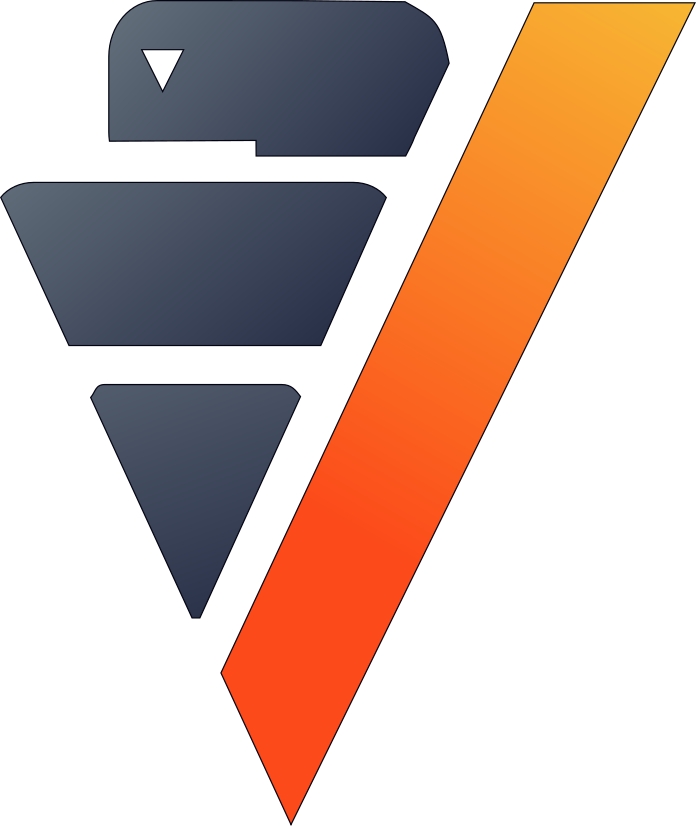

In [11]:
from verticapy.learn.linear_model import LinearRegression
from verticapy.learn.model_selection import cross_validate
cross_validate(LinearRegression("africa_lr", solver = "BFGS"), 
               input_relation = africa,
               X = africa.get_columns(exclude_columns = ["student_score"]),
               y = "student_score")

The model isn't bad. We're just using a few variables to get a median absolute error of 47; that is, our score has a distance of 47 from the true value. This seems high, but if we keep in mind that the final score is over 1000, our predictions are quite good.

Let's compare the importance of our features.

In [12]:
model = LinearRegression("africa_lr", solver = "BFGS")
model.fit(input_relation = africa,
          X = africa.get_columns(exclude_columns = ["student_score"]),
          y = "student_score")
x = model.features_importance()

The following factors seem to have the greatest influence on a student's performance:

<ul class="ul_content">
 <li>Having a good teacher</li>
 <li>Being of good socio-economic status</li>
 <li>Tanzanian teachers tend to overrate their students</li>
 <li>Age (younger students tend to perform better)</li>
 <li>Being able to get to school by car</li>
</ul>

Let's add the prediction to the vDataFrame to see how our model performs its estimations.

In [13]:
model.predict(africa, name = "estimated_student_score")
africa.boxplot(["estimated_student_score", "student_score"])

,count,mean,std,min,approx_25%,approx_50%,approx_75%,max
"""student_score""",53187,504.04486138049,86.6635761677015,117.532999839887,440.477255657786,493.341623606933,558.426056654596,943.673770012441
"""estimated_student_score""",53187,504.044854820435,46.8688907816558,383.47030012421,470.524720321282,497.526659532846,532.538926505113,689.969909839223

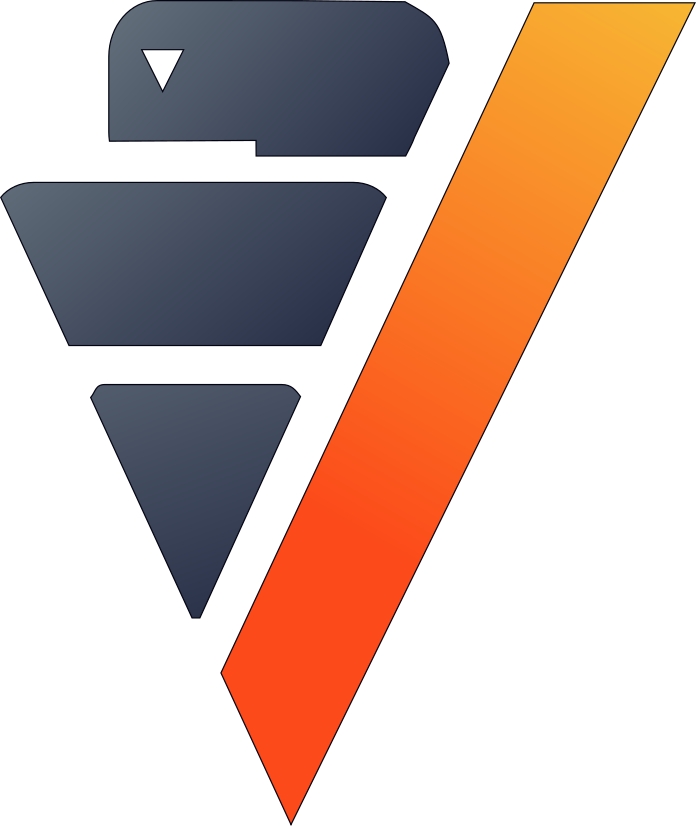

In [14]:
africa.describe(columns = ["student_score", "estimated_student_score"])

Our model has trouble catching outliers: exceptionally well-performing and struggling students.

Let's draw a residual plot.

In [15]:
africa["residual"] = africa["student_score"] - africa["estimated_student_score"]
africa.scatter(["residual", "student_score"])

We see a high heteroscedasticity, indicating that we can't trust the p-value of the coefficients.

In [16]:
model.coef_

array([ 19.98559453,   8.06019088,   6.51734115,   8.72050689,
       -12.25601014,  -5.90939743,  22.15292132,  11.14638302,
        -3.73140578,   4.90042492])

Let's look at the model's analysis of variance (ANOVA) table.

,Df,SS,MS,F,p_value
Regression,10,116833309.808147,11683330.9808147,2198.2268183057104,0.0
Residual,53176,282624524.030987,5314.888747385795,,
Total,53186,399457465.042041,,,

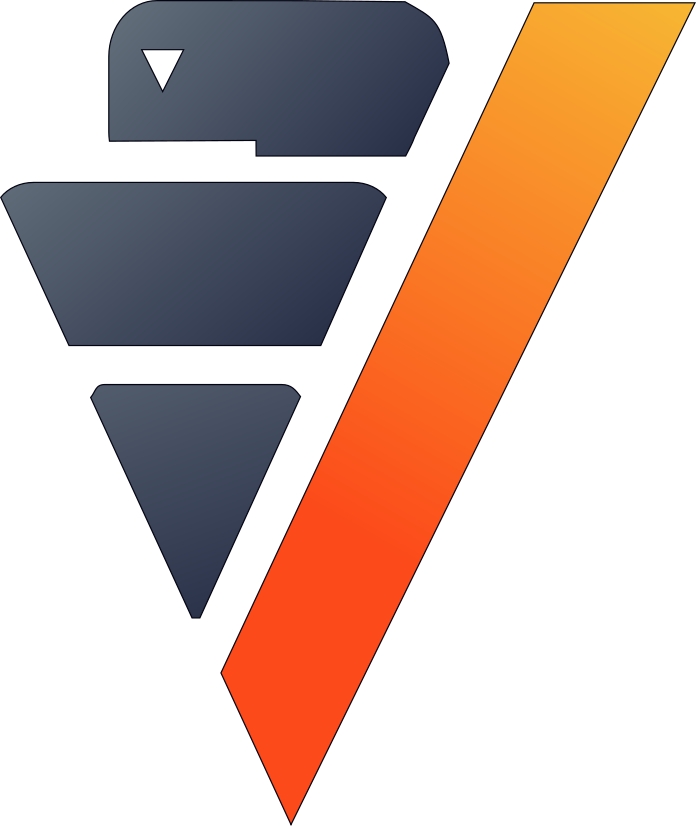

In [17]:
model.report("anova")

According to the ANOVA table, at least one of our variables is influencing the prediction.

We can also see that a student's estimated score and true score skew heavily from a normal distribution.

In [18]:
africa["estimated_student_score"].hist()

from verticapy.stats import jarque_bera
jarque_bera(africa, "estimated_student_score")

(4001.26169047401, 0.0)

Our model doesn't verify the basic hypothesis and therefore isn't stable enough to be put into production. Let's look at a second technique.

## Example with decomposition

Let's look at the same dataset, but use decomposition techniques to filter out unimportant information. We don't have to normalize our data or look at correlations with these types of methods.

We'll begin by repeating the data preparation process of the previous section and export the resulting vDataFrame to Vertica.

6722 elements were filtered.


,123student_scoreFloat(22),123teacher_scoreFloat(22),123teacher_year_teachingNumeric(9),123number_students_schoolInteger,123days_absentInteger,123ageInteger,123socio_eco_statutNumeric(9),123english_at_home_ALL_THE_TIMEInteger,123english_at_home_MOST_OF_THE_TIMEInteger,123english_at_home_NEVERInteger,123travel_distance_>0.5-1KMInteger,123travel_distance_>1-1.5KMInteger,123travel_distance_>1.5-2KMInteger,123travel_distance_>2-2.5KMInteger,123travel_distance_>2.5-3KMInteger,123travel_distance_>3-3.5KMInteger,123travel_distance_>3.5-4KMInteger,123travel_distance_>4.5-5KMInteger,123travel_distance_>4KM-4.5KMInteger,123travel_distance_>5KMInteger,123means_of_travel_BICYCLEInteger,123means_of_travel_BUS_TRUCK_VANInteger,123means_of_travel_CARInteger,123means_of_travel_OTHERInteger,123means_of_travel_TRAINInteger,...,123socio_eco_statut_3.000Integer,123socio_eco_statut_4.000Integer,123socio_eco_statut_5.000Integer,123socio_eco_statut_6.000Integer,123socio_eco_statut_7.000Integer,123socio_eco_statut_8.000Integer,123socio_eco_statut_9.000Integer,123socio_eco_statut_10.000Integer,123socio_eco_statut_11.000Integer,123socio_eco_statut_12.000Integer,123socio_eco_statut_13.000Integer,123socio_eco_statut_14.000Integer,123country_BotswanaInteger,123country_KenyaInteger,123country_LesothoInteger,123country_MalawiInteger,123country_MozambiqueInteger,123country_NamibiaInteger,123country_SeychellesInteger,123country_South_AfricaInteger,123country_SwazilandInteger,123country_TanzaniaInteger,123country_UgandaInteger,123country_ZambiaInteger,123country_ZanzibarInteger
1,425.993367323877,581.994282503848,10.0,23,0,14,5.0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
2,534.329515370892,581.994282503848,10.0,23,0,13,7.0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
3,536.690743411639,581.994282503848,10.0,23,0,12,8.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
4,569.392927563969,581.994282503848,10.0,23,0,13,9.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
5,542.037992351316,581.994282503848,10.0,23,0,12,11.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
6,573.771789981159,581.994282503848,10.0,23,0,12,11.0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
7,589.279157441376,581.994282503848,10.0,23,0,12,12.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
8,496.740841813343,581.994282503848,10.0,23,0,14,12.0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
9,535.805274812767,601.83282358059,1.0,22,0,13,10.0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
10,420.509155247374,715.046036359878,1.0,25,0,13,3.0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1

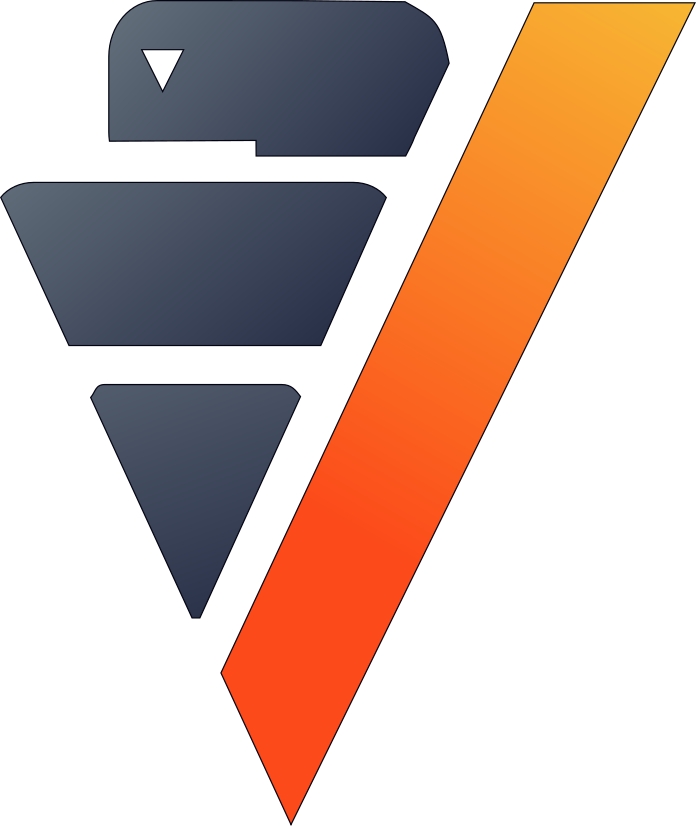

In [24]:
africa = vp.read_csv("data/africa_education.csv")
africa = africa.select(["(zralocp + zmalocp) / 2 AS student_score",
                        "zraloct AS teacher_score",
                        "XNUMYRS AS teacher_year_teaching",
                        "numstu AS number_students_school",
                        "PENGLISH AS english_at_home",
                        "PTRAVEL AS travel_distance",
                        "PTRAVEL2 AS means_of_travel",
                        "PMOTHER AS m_education",
                        "PFATHER AS f_education",
                        "PLIGHT AS source_of_lighting",
                        "PABSENT AS days_absent",
                        "PREPEAT AS repeated_grades",
                        "zpsit AS sitting_place",
                        "PAGE AS age",
                        "zpses AS socio_eco_statut",
                        "country_long AS country"])
africa.dropna()
africa.one_hot_encode(max_cardinality = 20)
africa.drop(columns = ["english_at_home",
                       "travel_distance",
                       "means_of_travel",
                       "m_education",
                       "f_education",
                       "source_of_lighting",
                       "repeated_grades",
                       "sitting_place",
                       "country"])
vp.drop("africa_clean", method = "table")
africa.to_db("africa_clean",
             relation_type = "table")

Let's create our principal component analysis (PCA) model.

,123student_scoreFloat(22),123col1Float(22),123col2Float(22),123col3Float(22),123col4Float(22),123col5Float(22),123col6Float(22),123col7Float(22),123col8Float(22),123col9Float(22),123col10Float(22),123col11Float(22),123col12Float(22),123col13Float(22),123col14Float(22),123col15Float(22),123col16Float(22),123col17Float(22),123col18Float(22),123col19Float(22),123col20Float(22),123col21Float(22),123col22Float(22),123col23Float(22),123col24Float(22),...,123col72Float(22),123col73Float(22),123col74Float(22),123col75Float(22),123col76Float(22),123col77Float(22),123col78Float(22),123col79Float(22),123col80Float(22),123col81Float(22),123col82Float(22),123col83Float(22),123col84Float(22),123col85Float(22),123col86Float(22),123col87Float(22),123col88Float(22),123col89Float(22),123col90Float(22),123col91Float(22),123col92Float(22),123col93Float(22),123col94Float(22),123col95Float(22),123col96Float(22)
1,425.993367323877,-165.813757009316,3.58868682347485,-2.68876051791736,0.00543322755943541,-1.71134925417442,0.047972784181927,0.388694455323428,-0.378809966731571,-0.0488204874042495,0.268654566259969,0.0217522378001771,-1.13004013037371,0.36496202773283,-0.812689205692659,0.315860865772909,0.34079235307562,0.29868556373134,0.494698335501277,-0.332211099301625,-0.287084894888462,-0.180659291207376,-0.514687358714265,0.830838886355012,0.0915621916819488,...,-0.177221121187624,-0.00275183126372452,0.101287089278648,0.0302016042873376,0.0151853603419411,-0.00585125645863527,0.157803783824772,-0.0175311967162362,0.0802312263481173,-0.0106391650321124,-0.0373836142567096,-0.0128282449351991,0.0222114589994321,-0.00440749840528188,-0.0217498447881973,0.00274594685072191,0.000897541702515522,-0.00697796194865361,-0.00156096925532271,-0.00431874854093645,-0.000220427634879913,7.38167232481997e-06,-0.000433132585082712,-0.000411358103879252,-8.73579974924568e-05
2,534.329515370892,-165.787800276364,3.75878315442097,-2.55287259006425,2.15664617580088,-1.16503972910828,-0.517255158956859,0.21273773941967,0.437982920453986,0.684578790221291,-0.271609613274503,-0.0620855919175003,0.513928441445958,0.293261231650037,-0.0105467303851893,0.860260723110013,0.206947880292624,0.091706275912011,0.239646536534935,-0.82930773032948,-0.491055594943048,-0.223969301033117,0.662935845925757,0.139089866902389,0.716568076288326,...,-0.0140213477075558,-0.0157636301431943,0.0548392642015666,0.00991106167635943,0.0068854715254916,-0.000330522946737262,0.0354977572585399,-0.00315876736746872,0.0499036807959601,-0.000649516301056455,0.00113457307806714,0.00402390297395321,0.0196255151683742,-0.00510514095994496,-0.0229737281792392,0.00634250841006572,-0.000135803976933155,-0.0097583529785866,-0.000415606872051498,-0.00112455455647661,-0.000564084821665147,-0.000311358647104682,-0.00011701006742379,-0.00012617823322621,-1.60128198249698e-05
3,536.690743411639,-165.771524936613,3.86185868996022,-2.47289846925753,3.39768085961798,-0.875365944350735,-1.32580173881293,0.335694510692076,-0.710595564881069,-0.158561634705969,-0.148223278977921,-0.575059958664926,-0.405376486677528,-0.256497620645854,-0.268422924340449,0.135823121334438,0.728219043221964,-0.133878771764508,0.568055775976842,-0.329679761565161,-0.382337914385915,-0.209308829579595,-0.179196170337383,-0.106903501497127,0.511070486112768,...,0.00299898099722515,0.0224359129091742,-0.00427476111797097,0.00503440677295821,-0.0254394980625158,0.00996267137733827,-0.120782174578379,-0.0314381871080867,0.0216922691008988,-0.00419212124937005,-0.00137643473369303,0.00934691202949979,0.019305698644608,-0.00128643484635665,0.00592477609047251,-0.00329165709195946,-0.000904010273736947,-0.0116859976986962,-0.000104447968127615,0.00114008279557696,-1.63580010404438e-05,8.54854367074626e-05,3.92387003658068e-05,1.33394526638461e-05,-4.6435450935642e-05
4,569.392927563969,-165.765317926556,3.90070979819554,-2.43494891989803,4.07546605280672,-0.623468617615572,-0.0766287422579379,0.102107149819784,0.117940733209586,0.862228810
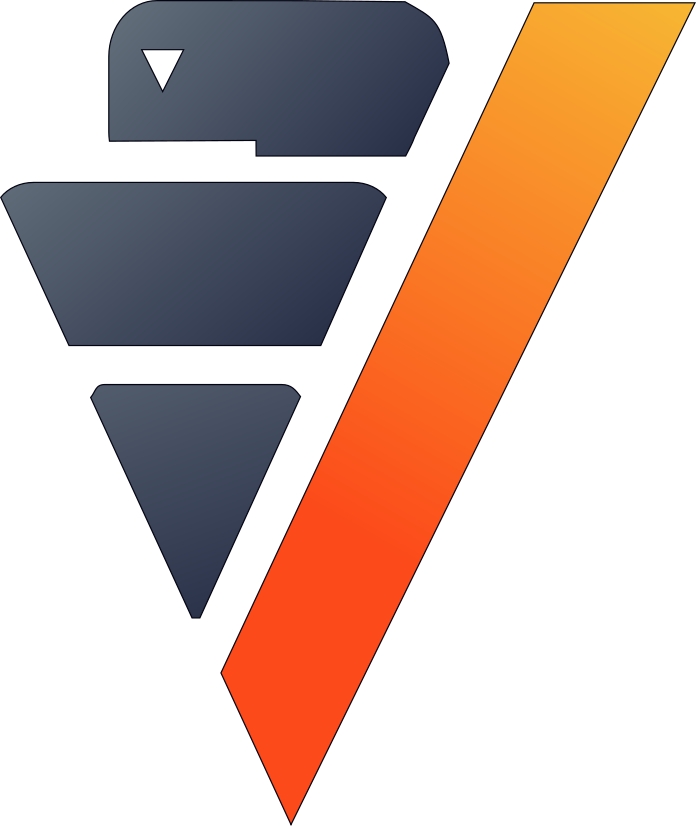

In [25]:
from verticapy.learn.decomposition import PCA
vp.drop("africa_pca")
model = PCA(name = "africa_pca")
model.fit("africa_clean",
          africa.get_columns(exclude_columns = ["student_score"]))
africa_pca = model.transform()
display(africa_pca)

We can verify the Gauss-Markov assumptions with our PCA model.

In [28]:
vp.set_option("plotting_lib","matplotlib")
africa_pca.corr()

<AxesSubplot:>

Let's use a cross-validation to test our linear regression model.

  0%|          | 0/3 [00:00<?, ?it/s]

,explained_variance,max_error,median_absolute_error,mean_absolute_error,mean_squared_error,root_mean_squared_error,r2,r2_adj,aic,bic,time
1-fold,0.406542147837413,381.377381967434,42.321802457313,52.1549710082439,4509.13724865015,67.1501098186008,0.406506116847415,0.403276584323741,149449.626786821,150202.48387636,4.423546075820923
2-fold,0.410222146579686,382.456645738697,42.5006435686933,51.9942401728598,4445.04112569299,66.6711416258413,0.410222003523684,0.407012145387638,149170.464279923,149923.304598801,4.633985996246338
3-fold,0.405169553262685,386.242511844056,42.04831284786,51.6820005012826,4439.37800301321,66.6286575207186,0.405168924305424,0.401929360949965,149047.075875319,149799.849082548,4.766168117523193
avg,0.40731128255992805,383.35884651672905,42.29025295795543,51.9437372274621,4464.518792452117,66.81663632172024,0.4072990148921743,0.40407269688711467,149222.38898068768,149975.21251923635,4.607900063196818
std,0.0021332058773568005,2.086120300463872,0.186005911079332,0.1963639235945825,31.634608840565697,0.23643837060050404,0.0021377430276719577,0.002150041987207658,168.3922801078864,168.42311490201922,0.14108584335398106

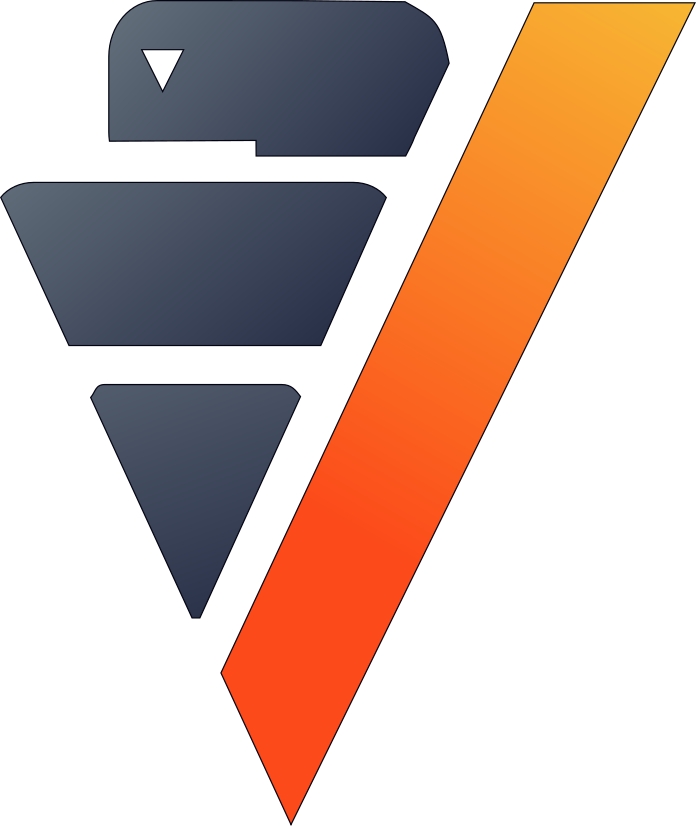

In [27]:
cross_validate(LinearRegression("africa_lr", solver = "BFGS"), 
               input_relation = africa_pca,
               X = africa_pca.get_columns(exclude_columns = ["student_score"]),
               y = "student_score")

As you can see, we've created a much more accurate model here than in our first attempt. This example emphasizes the importance of filtering noise from the data.

## Conclusion

We've seen two techniques that can help us create powerful linear regression models. While the first method normalized the data and looked for correlations, the second method applied a PCA model. The second one allows us to confirm the Gauss-Markov assumptions - an essential part of using linear models.